In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
from scipy.stats import skew
from tensorflow.keras import layers, models
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Markdown
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.linear_model import Ridge
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
sol_test_x = "/solTestX.txt"
sol_test_x_trans = "/solTestXtrans.txt"
sol_test_y = "/solTestY.txt"
sol_train_x = "/solTrainX.txt"
sol_train_x_trans = "/solTrainXtrans.txt"
sol_train_y = "/solTrainY.txt"

In [ ]:
display(Markdown("## Conjunto de treinamento de X:"))

## Conjunto de treinamento de X:

In [ ]:
df_sol_train_x = pd.read_csv(sol_train_x, sep="\t")

print("Dados carregados: solTrainX")
print(df_sol_train_x.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_train_x)
print(stats_train)

Dados carregados: solTrainX
            FP001       FP002       FP003       FP004       FP005       FP006  \
count  951.000000  951.000000  951.000000  951.000000  951.000000  951.000000   
mean     0.493165    0.539432    0.436383    0.584648    0.579390    0.400631   
std      0.500216    0.498705    0.496197    0.493042    0.493917    0.490284   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    1.000000    0.000000    1.000000    1.000000    0.000000   
75%      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   
max      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   

            FP007       FP008       FP009       FP010  ...   NumCarbon  \
count  951.000000  951.000000  951.000000  951.000000  ...  951.000000   
mean     0.363828    0.325973    0.279706    0.178759  ...    9.892744   
std      0.481353   

In [ ]:
display(Markdown("## Conjunto de treinamento de X transformado:"))

## Conjunto de treinamento de X transformado:

In [ ]:
df_sol_train_x_trans = pd.read_csv(sol_train_x_trans, sep="\t")

print("Dados carregados: solTrainXtrans")
print(df_sol_train_x_trans.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_train_x_trans)
print(stats_train)

Dados carregados: solTrainXtrans
            FP001       FP002       FP003       FP004       FP005       FP006  \
count  951.000000  951.000000  951.000000  951.000000  951.000000  951.000000   
mean     0.493165    0.539432    0.436383    0.584648    0.579390    0.400631   
std      0.500216    0.498705    0.496197    0.493042    0.493917    0.490284   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    1.000000    0.000000    1.000000    1.000000    0.000000   
75%      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   
max      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   

            FP007       FP008       FP009       FP010  ...   NumCarbon  \
count  951.000000  951.000000  951.000000  951.000000  ...  951.000000   
mean     0.363828    0.325973    0.279706    0.178759  ...    3.323978   
std      0.4813

In [ ]:
display(Markdown("## Conjunto de teste de X:"))

## Conjunto de teste de X:

In [ ]:
df_sol_test_x = pd.read_csv(sol_test_x, sep="\t")
print("Dados carregados: solTestX")
print(df_sol_test_x.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_test_x)
print(stats_train)

Dados carregados: solTestX
            FP001       FP002       FP003       FP004       FP005       FP006  \
count  316.000000  316.000000  316.000000  316.000000  316.000000  316.000000   
mean     0.468354    0.585443    0.443038    0.531646    0.617089    0.351266   
std      0.499789    0.493427    0.497533    0.499789    0.486868    0.478123   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    1.000000    0.000000    1.000000    1.000000    0.000000   
75%      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   
max      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   

            FP007       FP008       FP009       FP010  ...   NumCarbon  \
count  316.000000  316.000000  316.000000  316.000000  ...  316.000000   
mean     0.354430    0.360759    0.262658    0.193038  ...    9.784810   
std      0.479099    

In [ ]:
display(Markdown("## Conjunto de treinamento de X transformado:"))

## Conjunto de treinamento de X transformado:

In [ ]:
df_sol_test_x_trans = pd.read_csv(sol_test_x_trans, sep="\t")
print("Dados carregados: solTestXtrans")
print(df_sol_test_x_trans.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_test_x_trans)
print(stats_train)

Dados carregados: solTestXtrans
            FP001       FP002       FP003       FP004       FP005       FP006  \
count  316.000000  316.000000  316.000000  316.000000  316.000000  316.000000   
mean     0.468354    0.585443    0.443038    0.531646    0.617089    0.351266   
std      0.499789    0.493427    0.497533    0.499789    0.486868    0.478123   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    1.000000    0.000000    1.000000    1.000000    0.000000   
75%      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   
max      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   

            FP007       FP008       FP009       FP010  ...   NumCarbon  \
count  316.000000  316.000000  316.000000  316.000000  ...  316.000000   
mean     0.354430    0.360759    0.262658    0.193038  ...    3.313219   
std      0.47909

In [ ]:
display(Markdown("## Conjunto de treinamento de Y:"))

## Conjunto de treinamento de Y:

In [ ]:
df_sol_train_y = pd.read_csv(sol_train_y, sep="\t")
print("Dados carregados: solTrainY")
print(df_sol_train_y.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_train_y)
print(stats_train)

Dados carregados: solTrainY
                x
count  951.000000
mean    -2.718570
std      2.046641
min    -11.620000
25%     -3.955000
50%     -2.510000
75%     -1.360000
max      1.580000
      Mean  Skewness    StdDev
x -2.71857 -0.670373  2.046641


In [ ]:
display(Markdown("## Conjunto de teste de Y:"))

## Conjunto de teste de Y:

In [ ]:
df_sol_test_y = pd.read_csv(sol_test_y, sep="\t")
print("Dados carregados: solTestY")
print(df_sol_test_y.describe())

def calculate_statistics(df):
    stats = {
        'Mean': df.mean(),
        'Skewness': df.apply(skew),
        'StdDev': df.std()
    }
    return pd.DataFrame(stats)

stats_train = calculate_statistics(df_sol_test_y)
print(stats_train)

Dados carregados: solTestY
                x
count  316.000000
mean    -2.797025
std      2.078472
min    -10.410000
25%     -3.952500
50%     -2.480000
75%     -1.372500
max      1.070000
       Mean  Skewness    StdDev
x -2.797025 -0.734072  2.078472


In [ ]:
display(Markdown("## Assimetria do Conjunto de treinamento de X:"))

## Assimetria do Conjunto de treinamento de X:

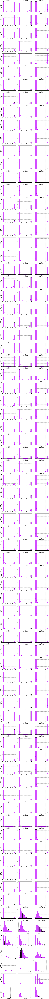

In [ ]:
num_cols = df_sol_train_x.columns

fig, axes = plt.subplots(76, 3, figsize=(15, 300))
axes = axes.flatten()

# Iterar sobre as colunas e criar gráficos
for i, col in enumerate(num_cols):
    sns.histplot(df_sol_train_x[col], kde=True, ax=axes[i], color='#BF00FF', edgecolor='black', alpha=0.7)
    axes[i].set_title(f'Distribuição de {col}', fontsize=10)
    axes[i].set_xlabel(col, fontsize=8)
    axes[i].set_ylabel('Contagem', fontsize=8)
    axes[i].grid(color='gray', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("## Assimetria do conjunto de treinamento de X transformado:"))

## Assimetria do conjunto de treinamento de X transformado:

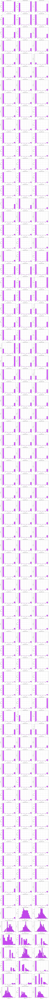

In [ ]:
num_cols = df_sol_train_x_trans.columns

fig, axes = plt.subplots(76, 3, figsize=(15, 300))
axes = axes.flatten()

# Iterar sobre as colunas e criar gráficos
for i, col in enumerate(num_cols):
    sns.histplot(df_sol_train_x_trans[col], kde=True, ax=axes[i], color='#BF00FF', edgecolor='black', alpha=0.7)
    axes[i].set_title(f'Distribuição de {col}', fontsize=10)
    axes[i].set_xlabel(col, fontsize=8)
    axes[i].set_ylabel('Contagem', fontsize=8)
    axes[i].grid(color='gray', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("## Matriz de correlação do conjunto de X transformado:"))

## Matriz de correlação do conjunto de X transformado:

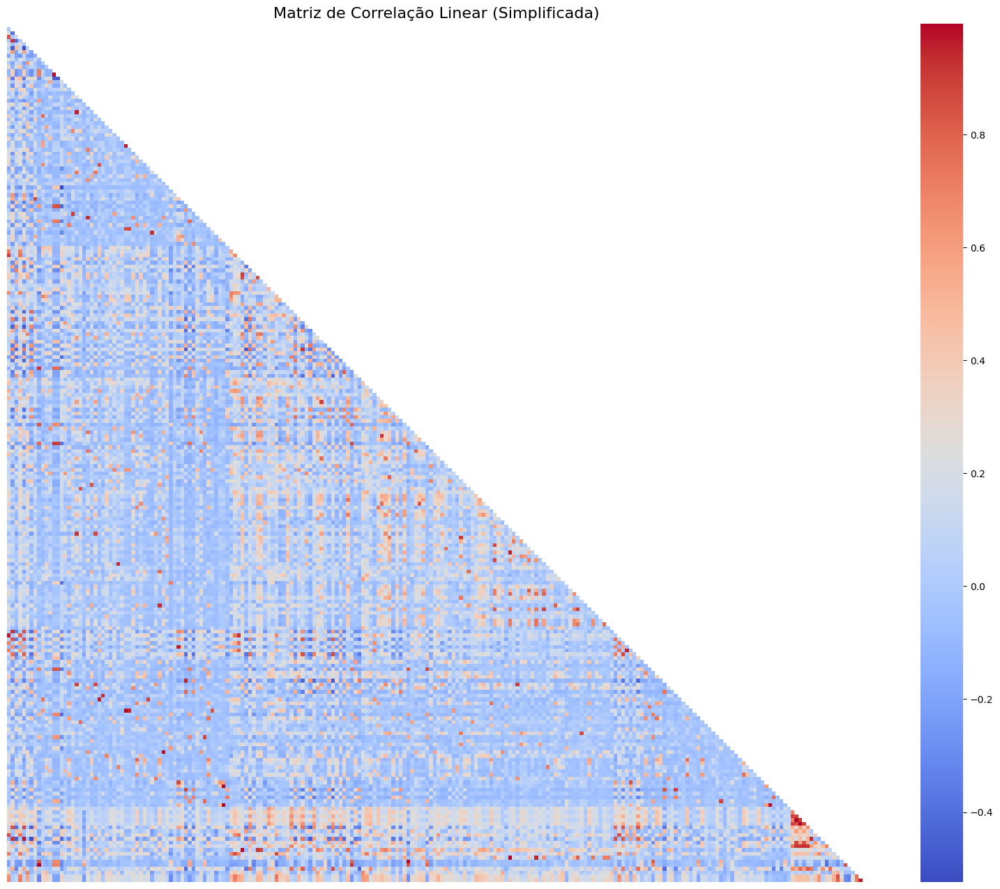

Pares com correlação forte (|correlação| > 0.59):
NumAtoms      NumBonds        0.996692
NumBonds      NumAtoms        0.996692
FP134         NumSulfer       0.996184
NumSulfer     FP134           0.996184
FP203         FP058           0.994812
FP058         FP203           0.994812
FP208         FP058           0.994770
FP058         FP208           0.994770
NumNonHBonds  NumNonHAtoms    0.994323
NumNonHAtoms  NumNonHBonds    0.994323
dtype: float64


In [ ]:
df_numerico = pd.get_dummies(df_sol_train_x_trans)
correlacao = df_numerico.corr()

# Aplicar máscara para esconder a metade superior
mask = np.triu(np.ones_like(correlacao, dtype=bool))

# Criar heatmap com anotação reduzida
plt.figure(figsize=(20, 16))
sns.heatmap(correlacao, mask=mask, cmap="coolwarm", cbar=True, square=True, xticklabels=False, yticklabels=False)

# Adicionar título
plt.title("Matriz de Correlação Linear (Simplificada)", fontsize=16)
plt.show()

# Encontrando pares com correlação forte (acima de 0.59)
correlacao_abs = correlacao.abs().unstack()
correlacao_abs = correlacao_abs[correlacao_abs < 1]  # Remover a diagonal principal
pares_fortes = correlacao_abs[correlacao_abs > 0.59].sort_values(ascending=False)

# Exibir os pares mais correlacionados
print("Pares com correlação forte (|correlação| > 0.59):")
print(pares_fortes.head(10))

In [ ]:
display(Markdown("## Adicionando coluna com 1 aos conjunto de X:"))

## Adicionando coluna com 1 aos conjunto de X:

In [ ]:
df_sol_test_x_trans_with_ones = np.c_[np.ones(df_sol_test_x_trans.shape[0]), df_sol_test_x_trans.values]
df_sol_train_x_trans_with_ones = np.c_[np.ones(df_sol_train_x_trans.shape[0]), df_sol_train_x_trans.values]

print(df_sol_test_x_trans_with_ones)
print(df_sol_train_x_trans_with_ones)

[[ 1.          1.          0.         ...  0.41656263  8.24532408
   8.24532408]
 [ 1.          1.          0.         ...  0.91500629  9.76580525
   9.76580525]
 [ 1.          0.          1.         ...  0.65218468  8.59153688
   8.59153688]
 ...
 [ 1.          1.          1.         ... -1.26050311  6.97040132
   6.97040132]
 [ 1.          1.          1.         ...  0.19773031 10.9998632
  10.9998632 ]
 [ 1.          1.          0.         ...  0.70034657 13.00745765
  13.00745765]]
[[ 1.          0.          1.         ... -1.60654181  6.81245608
   6.81245608]
 [ 1.          0.          1.         ... -0.44133043  9.75383434
  12.02960416]
 [ 1.          1.          1.         ... -0.3848591   8.24532408
   8.24532408]
 ...
 [ 1.          1.          0.         ... -1.4837828   5.45652203
   5.45652203]
 [ 1.          0.          0.         ... -0.53324165  0.
   0.        ]
 [ 1.          0.          0.         ... -1.38337864  3.83709565
   3.83709565]]


In [ ]:
display(Markdown("## OLS:"))
display(Markdown(r"$$\beta = \left( X^\top X \right)^{-1} X^\top y$$"))

## OLS:

$$\beta = \left( X^\top X \right)^{-1} X^\top y$$

In [ ]:
B = np.linalg.pinv(df_sol_train_x_trans_with_ones.T @ df_sol_train_x_trans_with_ones) @ df_sol_train_x_trans_with_ones.T @ df_sol_train_y

print(B.shape)

(229, 1)


In [ ]:
display(Markdown("## RMSE:"))
display(Markdown(r"$$RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^n e_i^2}$$"))
display(Markdown("## R²:"))
display(Markdown(r"""$$
R^2 = 1 - \frac{\sum (y_{\text{real}} - y_{\text{predito}})^2}{\sum (y_{\text{real}} - \bar{y})^2}
$$"""))

## RMSE:

$$RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^n e_i^2}$$

## R²:

$$
R^2 = 1 - \frac{\sum (y_{\text{real}} - y_{\text{predito}})^2}{\sum (y_{\text{real}} - \bar{y})^2}
$$

In [ ]:
output = (df_sol_test_x_trans_with_ones @ B).squeeze()

rmse = np.sqrt(mean_squared_error(df_sol_test_y, output))
print(f"RMSE: {rmse:.4f}")

r2 = r2_score(df_sol_test_y, output)
print(f"R²: {r2:.4f}")

RMSE: 0.7456
R²: 0.8709


In [ ]:
display(Markdown("## Valores reais vs preditos OLS:"))

## Valores reais vs preditos OLS:

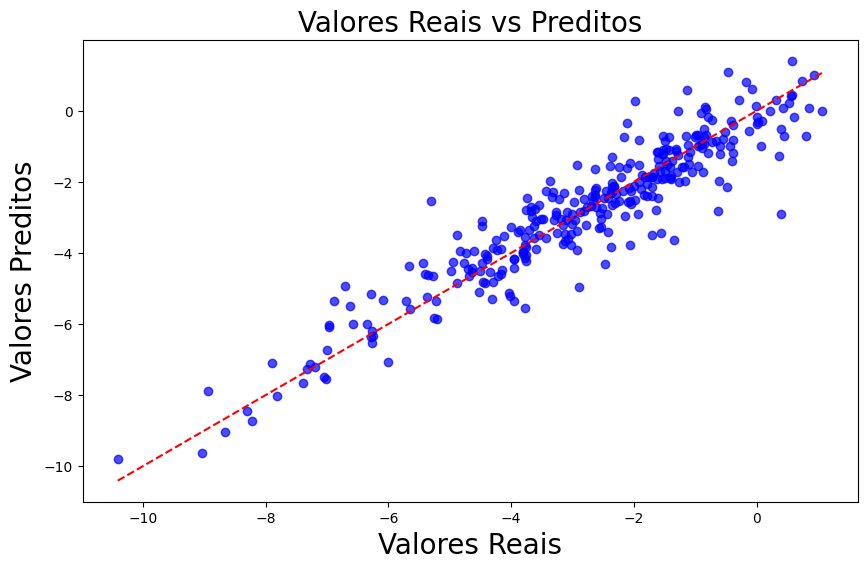

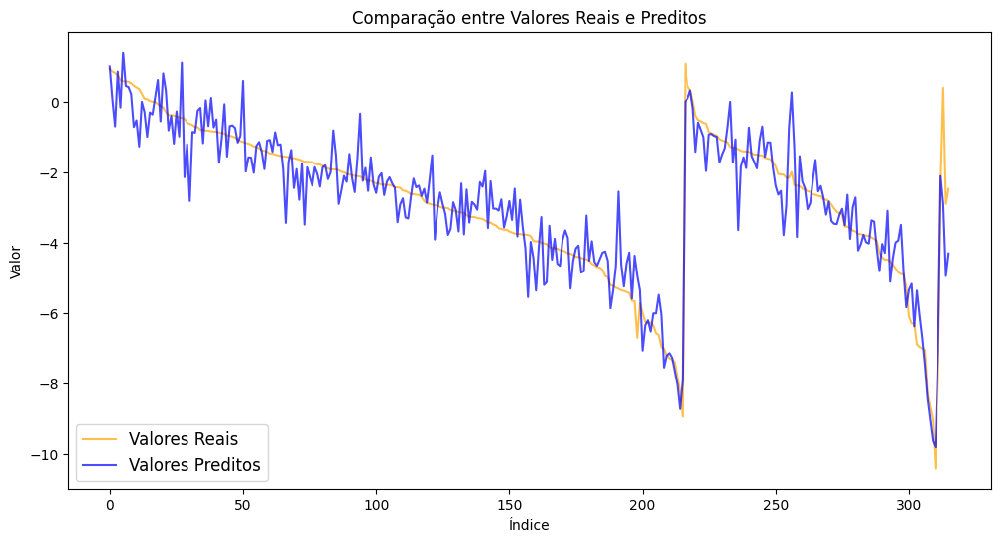

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df_sol_test_y, output, alpha=0.7, color="blue")
plt.plot([df_sol_test_y.min(),df_sol_test_y.max()],
         [df_sol_test_y.min(),df_sol_test_y.max()], color="red", linestyle="--")
plt.title("Valores Reais vs Preditos",fontsize=20)
plt.xlabel("Valores Reais" ,fontsize=20)
plt.ylabel("Valores Preditos",fontsize=20)
plt.show()

# Gráfico de linhas: Comparação valores reais vs preditos
plt.figure(figsize=(12, 6))
plt.plot(range(len(df_sol_test_y)), df_sol_test_y, label="Valores Reais", color="orange", alpha=0.7)
plt.plot(range(len(output)), output, label="Valores Preditos", color="blue", alpha=0.7)
plt.title("Comparação entre Valores Reais e Preditos")
plt.xlabel("Índice")
plt.ylabel("Valor")
plt.legend()
plt.show()

In [ ]:
display(Markdown("## K-Fold:"))

## K-Fold:

In [ ]:
def cross_validate_ols_plot(X, y, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    rmse_scores = []
    r2_scores = []

    all_y_test = []
    all_y_pred = []

    for train_index, test_index in kf.split(X):
        # Divisão dos dados
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Adicionar coluna de 1s para o intercepto
        X_train_with_ones = np.c_[np.ones(X_train.shape[0]), X_train]
        X_test_with_ones = np.c_[np.ones(X_test.shape[0]), X_test]

        # Treinando o modelo (OLS)
        B = np.linalg.pinv(X_train_with_ones.T @ X_train_with_ones) @ X_train_with_ones.T @ y_train

        # Previsões
        y_pred = (X_test_with_ones @ B).squeeze()

        # Acumulando valores reais e preditos para o gráfico
        all_y_test.extend(y_test)
        all_y_pred.extend(y_pred)

        # Cálculo das métricas
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)

        rmse_scores.append(rmse)
        r2_scores.append(r2)

    # Criar um único gráfico para todos os folds
    plt.figure(figsize=(10, 6))
    plt.scatter(all_y_test, all_y_pred, alpha=0.7, color="blue")
    plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)],
             color="red", linestyle="--", linewidth=2)
    plt.title(f"Valores Reais vs Preditos para {n_splits}-Fold Cross Validation",fontsize=20)
    plt.xlabel("Valores Reais",fontsize=20)
    plt.ylabel("Valores Preditos",fontsize=20)
    plt.show()

    print(f"{n_splits}-Fold - RMSE Médio: {np.mean(rmse_scores):.4f}, R² Médio: {np.mean(r2_scores):.4f}")

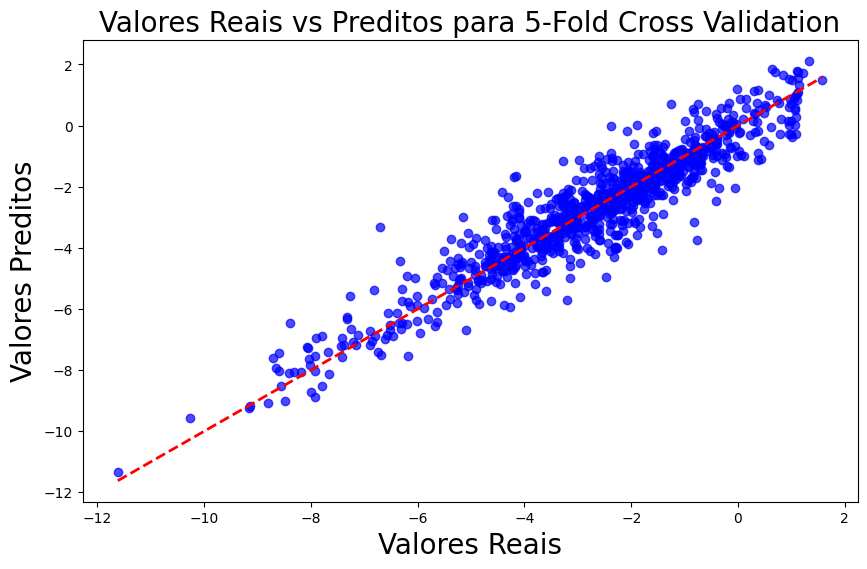

5-Fold - RMSE Médio: 0.7338, R² Médio: 0.8698


In [ ]:
cross_validate_ols_plot(df_sol_train_x_trans.values, df_sol_train_y.values, n_splits=5)

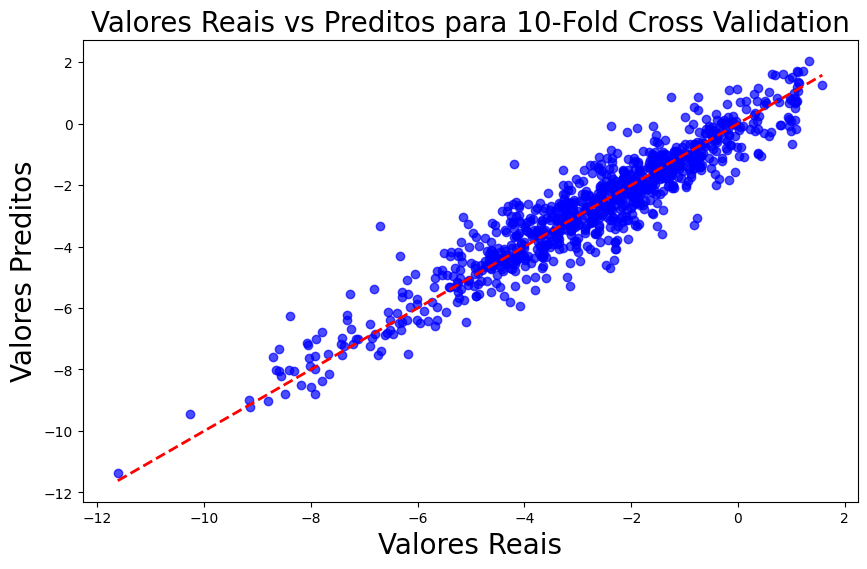

10-Fold - RMSE Médio: 0.7005, R² Médio: 0.8761


In [ ]:
cross_validate_ols_plot(df_sol_train_x_trans.values, df_sol_train_y.values, n_splits=10)

In [ ]:
display(Markdown("## Rigde:"))
display(Markdown(r"""$$
\beta = \left( X^\top X + \lambda I \right)^{-1} X^\top y
$$"""))

## Rigde:

$$
\beta = \left( X^\top X + \lambda I \right)^{-1} X^\top y
$$

In [ ]:
# Função para calcular Ridge do zero
def ridge_regression(X, y, lambda_val):
    n_features = X.shape[1]
    I = np.identity(n_features)  # Matriz identidade
    B = np.linalg.inv(X.T @ X + lambda_val * I) @ X.T @ y
    return B

# Função para validação cruzada da regressão Ridge
def cross_validate_ridge(X, y, lambda_values, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    resultados = []

    for lambda_val in lambda_values:
        rmse_scores = []
        r2_scores = []

        for train_index, val_index in kf.split(X):
            # Divisão dos dados
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]

            # Adicionar intercepto
            X_train_with_ones = np.c_[np.ones(X_train.shape[0]), X_train]
            X_val_with_ones = np.c_[np.ones(X_val.shape[0]), X_val]

            # Treinar modelo Ridge
            B = ridge_regression(X_train_with_ones, y_train, lambda_val)

            # Previsão no conjunto de validação
            y_pred = X_val_with_ones @ B

            # Calcular RMSE e R²
            rmse = np.sqrt(mean_squared_error(y_val, y_pred))
            r2 = r2_score(y_val, y_pred)

            rmse_scores.append(rmse)
            r2_scores.append(r2)

        # Média dos RMSE e R² para o lambda atual
        resultados.append((lambda_val, np.mean(rmse_scores), np.mean(r2_scores)))

    return resultados

# Espaço de busca para lambda
lambda_values = np.logspace(-3, 3, 10)

# Preparar os dados (substitua pelos seus dados reais)
X = df_sol_train_x_trans.values  # Matriz de preditores
y = df_sol_train_y.values  # Vetor de resposta

# Executar validação cruzada para 5 e 10 folds
resultados_5 = cross_validate_ridge(X, y, lambda_values, n_splits=5)
resultados_10 = cross_validate_ridge(X, y, lambda_values, n_splits=10)

# Melhor lambda para cada validação
melhor_lambda_5, melhor_rmse_5, melhor_r2_5 = min(resultados_5, key=lambda x: x[1])
melhor_lambda_10, melhor_rmse_10, melhor_r2_10 = min(resultados_10, key=lambda x: x[1])

# Comparação com Ridge do sklearn para melhor lambda (5 folds)
ridge_model_5 = Ridge(alpha=melhor_lambda_5, fit_intercept=True)
ridge_model_5.fit(X, y)
y_pred_sklearn_5 = ridge_model_5.predict(X)
rmse_sklearn_5 = np.sqrt(mean_squared_error(y, y_pred_sklearn_5))
r2_sklearn_5 = r2_score(y, y_pred_sklearn_5)

# Comparação com Ridge do sklearn para melhor lambda (10 folds)
ridge_model_10 = Ridge(alpha=melhor_lambda_10, fit_intercept=True)
ridge_model_10.fit(X, y)
y_pred_sklearn_10 = ridge_model_10.predict(X)
rmse_sklearn_10 = np.sqrt(mean_squared_error(y, y_pred_sklearn_10))
r2_sklearn_10 = r2_score(y, y_pred_sklearn_10)

# Exibir os resultados
print("Validação cruzada para Ridge (5-Fold):")
print("Lambda | RMSE Médio | R² Médio")
for lambda_val, rmse, r2 in resultados_5:
    print(f"{lambda_val:.3f} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Lambda (5-Fold):", melhor_lambda_5)
print("===========================================================================")
print("RMSE do modelo EM PYTHON com melhor lambda (5-Fold, sklearn):", rmse_sklearn_5)
print("R² do modelo EM PYTHON com melhor lambda (5-Fold, sklearn):", r2_sklearn_5)

print("\nValidação cruzada para Ridge (10-Fold):")
print("Lambda | RMSE Médio | R² Médio")
for lambda_val, rmse, r2 in resultados_10:
    print(f"{lambda_val:.3f} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Lambda (10-Fold):", melhor_lambda_10)
print("===========================================================================")
print("RMSE do modelo EM PYTHON com melhor lambda (10-Fold, sklearn):", rmse_sklearn_10)
print("R² do modelo EM PYTHON com melhor lambda (10-Fold, sklearn):", r2_sklearn_10)

Validação cruzada para Ridge (5-Fold):
Lambda | RMSE Médio | R² Médio
0.001 | 0.7328 | 0.8701
0.005 | 0.7314 | 0.8706
0.022 | 0.7317 | 0.8704
0.100 | 0.7299 | 0.8711
0.464 | 0.7154 | 0.8763
2.154 | 0.6941 | 0.8836
10.000 | 0.6923 | 0.8841
46.416 | 0.7277 | 0.8717
215.443 | 0.8501 | 0.8251
1000.000 | 1.0956 | 0.7100

Melhor Lambda (5-Fold): 10.0
RMSE do modelo EM PYTHON com melhor lambda (5-Fold, sklearn): 0.5511714054940262
R² do modelo EM PYTHON com melhor lambda (5-Fold, sklearn): 0.9273982958322717

Validação cruzada para Ridge (10-Fold):
Lambda | RMSE Médio | R² Médio
0.001 | 0.6999 | 0.8763
0.005 | 0.6991 | 0.8768
0.022 | 0.7006 | 0.8764
0.100 | 0.7032 | 0.8754
0.464 | 0.6981 | 0.8770
2.154 | 0.6849 | 0.8816
10.000 | 0.6862 | 0.8815
46.416 | 0.7218 | 0.8694
215.443 | 0.8361 | 0.8262
1000.000 | 1.0736 | 0.7161

Melhor Lambda (10-Fold): 2.154434690031882
RMSE do modelo EM PYTHON com melhor lambda (10-Fold, sklearn): 0.5177716640726546
R² do modelo EM PYTHON com melhor lambda (10-Fol

In [ ]:
display(Markdown("## PLS:"))

## PLS:

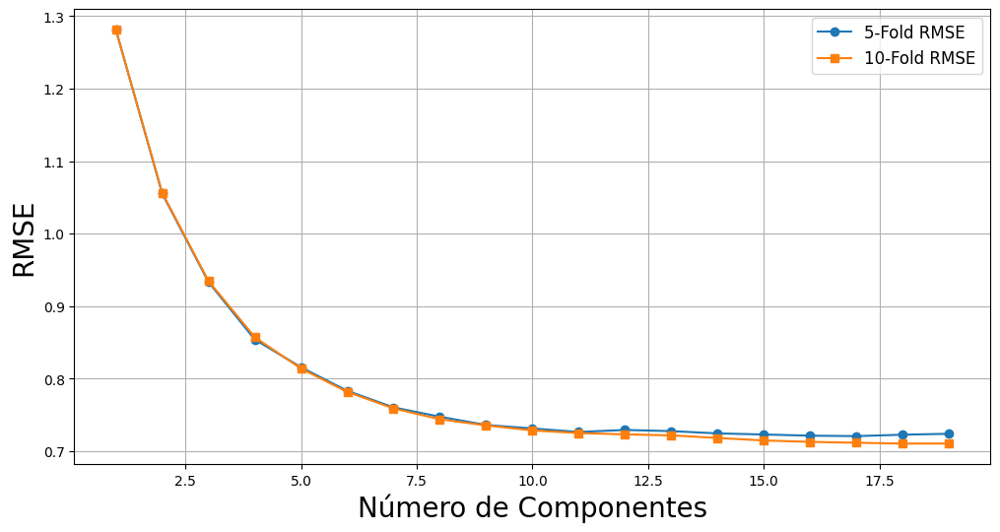

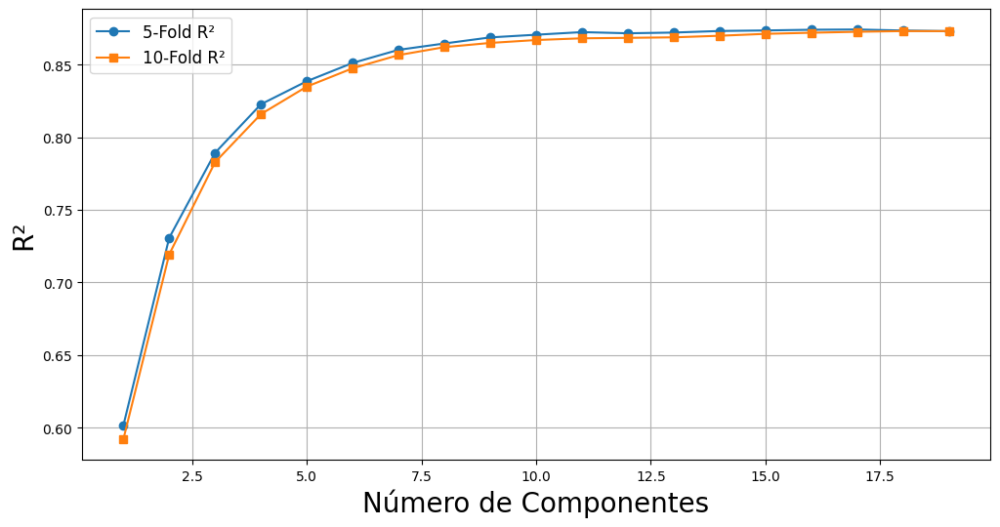

Validação cruzada para PLS (5-Fold):
Componentes | RMSE Médio | R² Médio
1 | 1.2811 | 0.6015
2 | 1.0553 | 0.7308
3 | 0.9333 | 0.7893
4 | 0.8540 | 0.8227
5 | 0.8156 | 0.8386
6 | 0.7831 | 0.8512
7 | 0.7603 | 0.8602
8 | 0.7474 | 0.8646
9 | 0.7360 | 0.8688
10 | 0.7313 | 0.8706
11 | 0.7264 | 0.8724
12 | 0.7292 | 0.8716
13 | 0.7276 | 0.8721
14 | 0.7244 | 0.8732
15 | 0.7229 | 0.8736
16 | 0.7213 | 0.8741
17 | 0.7207 | 0.8742
18 | 0.7226 | 0.8735
19 | 0.7239 | 0.8731

Melhor Número de Componentes (5-Fold): 17
RMSE do modelo com melhor número de componentes (5-Fold, sklearn): 0.5433999159677994
R² do modelo com melhor número de componentes (5-Fold, sklearn): 0.929431222856628

Validação cruzada para PLS (10-Fold):
Componentes | RMSE Médio | R² Médio
1 | 1.2813 | 0.5920
2 | 1.0563 | 0.7194
3 | 0.9347 | 0.7829
4 | 0.8572 | 0.8160
5 | 0.8139 | 0.8349
6 | 0.7816 | 0.8475
7 | 0.7589 | 0.8566
8 | 0.7439 | 0.8621
9 | 0.7355 | 0.8650
10 | 0.7285 | 0.8670
11 | 0.7249 | 0.8682
12 | 0.7231 | 0.8685
13 | 0.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Função para validação cruzada da regressão PLS
def cross_validate_pls(X, y, n_components_values, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    resultados = []

    for n_components in n_components_values:
        rmse_scores = []
        r2_scores = []

        for train_index, val_index in kf.split(X):
            # Divisão dos dados
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]

            # Treinar modelo PLS
            pls = PLSRegression(n_components=n_components)
            pls.fit(X_train, y_train)

            # Previsão no conjunto de validação
            y_pred = pls.predict(X_val).squeeze()

            # Calcular RMSE e R²
            rmse = np.sqrt(mean_squared_error(y_val, y_pred))
            r2 = r2_score(y_val, y_pred)

            rmse_scores.append(rmse)
            r2_scores.append(r2)

        # Média dos RMSE e R² para o número de componentes atual
        resultados.append((n_components, np.mean(rmse_scores), np.mean(r2_scores)))

    return resultados

# Espaço de busca para o número de componentes
n_components_values = range(1, 20)

# Definir os dados corretamente
X = df_sol_train_x_trans.values
y = df_sol_train_y.values

# Executar validação cruzada para 5 e 10 folds
resultados_5 = cross_validate_pls(X, y, n_components_values, n_splits=5)
resultados_10 = cross_validate_pls(X, y, n_components_values, n_splits=10)

# Melhor número de componentes para cada validação (baseado no menor RMSE)
melhor_n_components_5, melhor_rmse_5, melhor_r2_5 = min(resultados_5, key=lambda x: x[1])
melhor_n_components_10, melhor_rmse_10, melhor_r2_10 = min(resultados_10, key=lambda x: x[1])

# Avaliação final do modelo usando os melhores componentes identificados
def avaliar_pls(X, y, melhor_n_components):
    pls = PLSRegression(n_components=melhor_n_components)
    pls.fit(X, y)
    y_pred = pls.predict(X).squeeze()
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    r2 = r2_score(y, y_pred)
    return rmse, r2

# Avaliar PLS com os melhores componentes para 5 e 10 folds
rmse_sklearn_5, r2_sklearn_5 = avaliar_pls(X, y, melhor_n_components_5)
rmse_sklearn_10, r2_sklearn_10 = avaliar_pls(X, y, melhor_n_components_10)

# Plotar RMSE para 5 e 10 folds
plt.figure(figsize=(12, 6))
plt.plot(n_components_values, [r[1] for r in resultados_5], label="5-Fold RMSE", marker="o")
plt.plot(n_components_values, [r[1] for r in resultados_10], label="10-Fold RMSE", marker="s")
plt.xlabel("Número de Componentes",fontsize=20)
plt.ylabel("RMSE",fontsize=20)
plt.legend()
plt.grid(True)
plt.show()

# Plotar R² para 5 e 10 folds
plt.figure(figsize=(12, 6))
plt.plot(n_components_values, [r[2] for r in resultados_5], label="5-Fold R²", marker="o")
plt.plot(n_components_values, [r[2] for r in resultados_10], label="10-Fold R²", marker="s")
plt.xlabel("Número de Componentes",fontsize=20)
plt.ylabel("R²",fontsize=20)
plt.legend()
plt.grid(True)
plt.show()

# Exibir os resultados
print("Validação cruzada para PLS (5-Fold):")
print("Componentes | RMSE Médio | R² Médio")
for n_components, rmse, r2 in resultados_5:
    print(f"{n_components} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Número de Componentes (5-Fold):", melhor_n_components_5)
print("RMSE do modelo com melhor número de componentes (5-Fold, sklearn):", rmse_sklearn_5)
print("R² do modelo com melhor número de componentes (5-Fold, sklearn):", r2_sklearn_5)

print("\nValidação cruzada para PLS (10-Fold):")
print("Componentes | RMSE Médio | R² Médio")
for n_components, rmse, r2 in resultados_10:
    print(f"{n_components} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Número de Componentes (10-Fold):", melhor_n_components_10)
print("RMSE do modelo com melhor número de componentes (10-Fold, sklearn):", rmse_sklearn_10)
print("R² do modelo com melhor número de componentes (10-Fold, sklearn):", r2_sklearn_10)


In [ ]:
display(Markdown("## PCR:"))

## PCR:

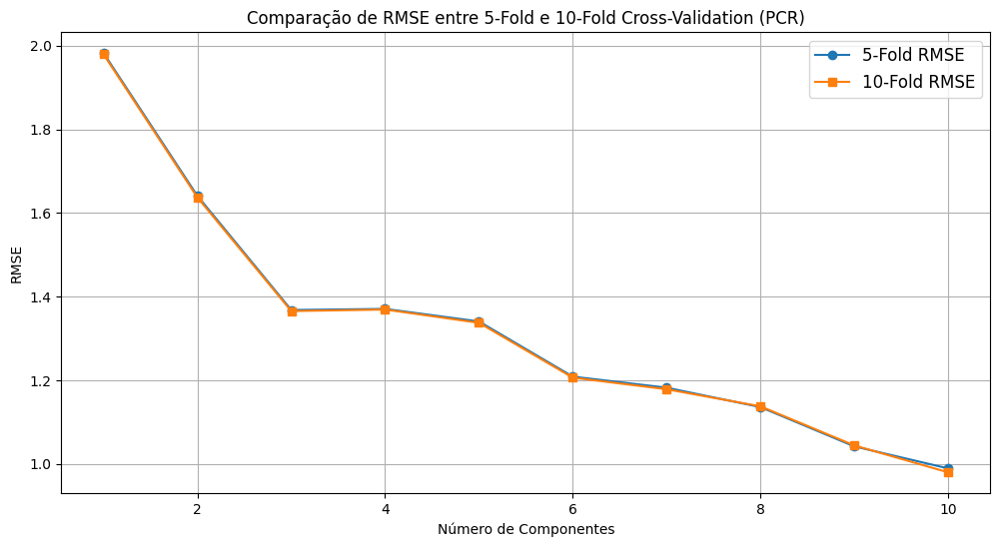

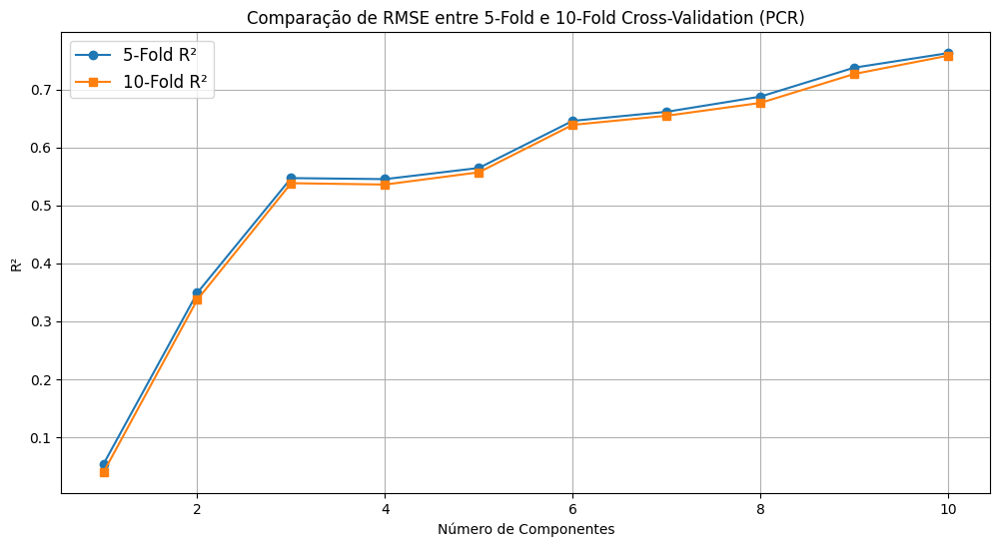

Validação cruzada para PCR (5-Fold):
Componentes | RMSE Médio | R² Médio
1 | 1.9821 | 0.0534
2 | 1.6408 | 0.3491
3 | 1.3681 | 0.5472
4 | 1.3708 | 0.5454
5 | 1.3407 | 0.5647
6 | 1.2089 | 0.6460
7 | 1.1824 | 0.6617
8 | 1.1360 | 0.6879
9 | 1.0421 | 0.7379
10 | 0.9895 | 0.7630

Melhor Número de Componentes (5-Fold): 10
RMSE do modelo com melhor número de componentes (5-Fold, sklearn): 0.9690421281542788
R² do modelo com melhor número de componentes (5-Fold, sklearn): 0.7755814386730141

Validação cruzada para PCR (10-Fold):
Componentes | RMSE Médio | R² Médio
1 | 1.9791 | 0.0392
2 | 1.6371 | 0.3374
3 | 1.3656 | 0.5384
4 | 1.3692 | 0.5361
5 | 1.3375 | 0.5572
6 | 1.2065 | 0.6392
7 | 1.1787 | 0.6548
8 | 1.1379 | 0.6770
9 | 1.0444 | 0.7270
10 | 0.9801 | 0.7586

Melhor Número de Componentes (10-Fold): 10
RMSE do modelo com melhor número de componentes (10-Fold, sklearn): 0.9691283842187373
R² do modelo com melhor número de componentes (10-Fold, sklearn): 0.7755414851501503


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Função para validação cruzada da regressão PCR
def cross_validate_pcr(X, y, n_components_values, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    resultados = []

    for n_components in n_components_values:
        rmse_scores = []
        r2_scores = []

        for train_index, val_index in kf.split(X):
            # Divisão dos dados
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]

            # Redução de dimensionalidade com PCA
            pca = PCA(n_components=n_components)
            X_train_pca = pca.fit_transform(X_train)
            X_val_pca = pca.transform(X_val)

            # Regressão Linear no espaço reduzido
            reg = LinearRegression()
            reg.fit(X_train_pca, y_train)

            # Previsão no conjunto de validação
            y_pred = reg.predict(X_val_pca)

            # Calcular RMSE e R²
            rmse = np.sqrt(mean_squared_error(y_val, y_pred))
            r2 = r2_score(y_val, y_pred)

            rmse_scores.append(rmse)
            r2_scores.append(r2)

        # Média dos RMSE e R² para o número de componentes atual
        resultados.append((n_components, np.mean(rmse_scores), np.mean(r2_scores)))

    return resultados

# Espaço de busca para o número de componentes
n_components_values = range(1, 11)

# Executar validação cruzada para 5 e 10 folds
resultados_5 = cross_validate_pcr(df_sol_train_x_trans.values, df_sol_train_y.values, n_components_values, n_splits=5)
resultados_10 = cross_validate_pcr(df_sol_train_x_trans.values, df_sol_train_y.values, n_components_values, n_splits=10)

# Melhor número de componentes para cada validação
melhor_n_components_5, melhor_rmse_5, melhor_r2_5 = min(resultados_5, key=lambda x: x[1])
melhor_n_components_10, melhor_rmse_10, melhor_r2_10 = min(resultados_10, key=lambda x: x[1])

# Comparação com PCR para melhor número de componentes (5 folds)
pca_5 = PCA(n_components=melhor_n_components_5)
X_pca_5 = pca_5.fit_transform(df_sol_train_x_trans.values)
reg_5 = LinearRegression()
reg_5.fit(X_pca_5, df_sol_train_y.values)
y_pred_sklearn_5 = reg_5.predict(X_pca_5)
rmse_sklearn_5 = np.sqrt(mean_squared_error(df_sol_train_y.values, y_pred_sklearn_5))
r2_sklearn_5 = r2_score(df_sol_train_y.values, y_pred_sklearn_5)

# Comparação com PCR para melhor número de componentes (10 folds)
pca_10 = PCA(n_components=melhor_n_components_10)
X_pca_10 = pca_10.fit_transform(df_sol_train_x_trans.values)
reg_10 = LinearRegression()
reg_10.fit(X_pca_10, df_sol_train_y.values)
y_pred_sklearn_10 = reg_10.predict(X_pca_10)
rmse_sklearn_10 = np.sqrt(mean_squared_error(df_sol_train_y.values, y_pred_sklearn_10))
r2_sklearn_10 = r2_score(df_sol_train_y.values, y_pred_sklearn_10)

# Plotar resultados para 5 e 10 folds
plt.figure(figsize=(12, 6))
plt.plot(n_components_values, [r[1] for r in resultados_5], label="5-Fold RMSE", marker="o")
plt.plot(n_components_values, [r[1] for r in resultados_10], label="10-Fold RMSE", marker="s")
plt.xlabel("Número de Componentes")
plt.ylabel("RMSE")
plt.title("Comparação de RMSE entre 5-Fold e 10-Fold Cross-Validation (PCR)")
plt.legend()
plt.grid(True)
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(n_components_values, [r[2] for r in resultados_5], label="5-Fold R²", marker="o")
plt.plot(n_components_values, [r[2] for r in resultados_10], label="10-Fold R²", marker="s")
plt.xlabel("Número de Componentes")
plt.ylabel("R²")
plt.title("Comparação de RMSE entre 5-Fold e 10-Fold Cross-Validation (PCR)")
plt.legend()
plt.grid(True)
plt.show()

# Exibir os resultados
print("Validação cruzada para PCR (5-Fold):")
print("Componentes | RMSE Médio | R² Médio")
for n_components, rmse, r2 in resultados_5:
    print(f"{n_components} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Número de Componentes (5-Fold):", melhor_n_components_5)
print("RMSE do modelo com melhor número de componentes (5-Fold, sklearn):", rmse_sklearn_5)
print("R² do modelo com melhor número de componentes (5-Fold, sklearn):", r2_sklearn_5)

print("\nValidação cruzada para PCR (10-Fold):")
print("Componentes | RMSE Médio | R² Médio")
for n_components, rmse, r2 in resultados_10:
    print(f"{n_components} | {rmse:.4f} | {r2:.4f}")

print("\nMelhor Número de Componentes (10-Fold):", melhor_n_components_10)
print("RMSE do modelo com melhor número de componentes (10-Fold, sklearn):", rmse_sklearn_10)
print("R² do modelo com melhor número de componentes (10-Fold, sklearn):", r2_sklearn_10)


In [ ]:
display(Markdown("## Rede Neural:"))

## Rede Neural:

In [ ]:
df_sol_train_x_trans = pd.read_csv(sol_train_x_trans, sep="\t")
print(f"Dimensões de X: {df_sol_train_x_trans.shape}")
print(f"Dimensões de y: {df_sol_train_y.shape}")


Dimensões de X: (951, 228)
Dimensões de y: (951, 1)


In [ ]:

# Número de iterações
n_iteracoes = 9
rmse_list = []
r2_list = []
for i in range(n_iteracoes):
    print(f"Iteração {i+1}/{n_iteracoes}")

    # Criando o modelo
    model = models.Sequential()

    # Adicionando camadas
    model.add(layers.Dense(64, activation='relu', input_shape=(df_sol_test_x_trans.shape[1],)))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dense(1, activation='linear'))  # Função de ativação linear para regressão

    # Compilando o modelo
    model.compile(optimizer='adam', loss='mse')  # Usamos 'mse' para regressão

    # Treinando o modelo
    model.fit(df_sol_train_x_trans, df_sol_train_y, epochs=100, batch_size=32, verbose=0)  # verbose=0 para evitar saída detalhada

    # Fazendo previsões no conjunto de teste
    y_pred = model.predict(df_sol_test_x_trans)

    # Calculando RMSE
    r2 = r2_score(df_sol_test_y, y_pred)
    r2_list.append(r2)
    rmse = np.sqrt(mean_squared_error(df_sol_test_y, y_pred))
    rmse_list.append(rmse)  # Armazenando o RMSE da iteração atual

    print(f"RMSE da iteração {i+1}: {rmse}")
    print(f"R2 da iteração {i+1}: {r2}")


# Calculando o RMSE médio
rmse_medio = np.mean(rmse_list)
r2_medio = np.mean(r2_list)
print(f"\nRMSE médio após {n_iteracoes} iterações: {rmse_medio}")
print(f"\nR2 médio após {n_iteracoes} iterações: {r2_medio}")


Iteração 1/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
RMSE da iteração 1: 0.8721170615794077
R2 da iteração 1: 0.8233808875083923
Iteração 2/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
RMSE da iteração 2: 0.68444228777771
R2 da iteração 2: 0.8912168145179749
Iteração 3/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
RMSE da iteração 3: 0.6839221056746725
R2 da iteração 3: 0.891382098197937
Iteração 4/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
RMSE da iteração 4: 0.6755474104955815
R2 da iteração 4: 0.8940258622169495
Iteração 5/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
RMSE da iteração 5: 0.7509260024175968
R2 da iteração 5: 0.8690569400787354
Iteração 6/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
RMSE da iteração 6: 0.8718497583707367
R2 da iteração 6: 0.8234891295433044
Iteração 7/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
RMSE da iteração 7: 0.8817066930135457
R2 da iteração 7: 0.8194754123687744
Iteração 8/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
RMSE da iteração 8: 0.7617537270364955
R2 da iteração 8: 0.8652535676956177
Iteração 9/9


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
RMSE da iteração 9: 0.7282042464325513
R2 da iteração 9: 0.8768612742424011

RMSE médio após 9 iterações: 0.7678299214220331

R2 médio após 9 iterações: 0.8615713318188986
